In [1]:
 %tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras
from tqdm.autonotebook import tqdm
import numpy as np
from tensorflow.keras.layers import *
import matplotlib.pyplot as plt

TensorFlow 2.x selected.


/usr/local/lib/python3.6/dist-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()
x_train = np.float32((x_train / 255)*2 - 1).reshape(-1,28,28,1)
x_test = np.float32((x_test / 255)*2 - 1).reshape(-1,28,28,1)

11493376/11490434 [==============================] - 0s 0us/step


In [ ]:
def plot():
    n_im = 10
    im = Gen(tf.random.normal((n_im,)+noise_shape))
    plt.figure(figsize = (18/12*n_im,18/12*(1.1)))
    for i in range(n_im):
        plt.subplot(1,10,i+1)
        plt.title(Disc(im).numpy()[i])
        plt.imshow(im[i].numpy().reshape(28,28),cmap = 'Greys')
    plt.show()

In [ ]:
dropout = 0.5
leak = 0.3

Gen = keras.Sequential([
    Dense(7*7*256, input_shape = (100,),use_bias = False),
    BatchNormalization(),
    LeakyReLU(leak),
    
    Reshape((7,7,256)),
    
    #Conv2DTranspose(128, 5, strides = 1, padding = 'same', use_bias = False),
    Conv2D(128, 5, padding = 'same', use_bias = False),
    BatchNormalization(),
    LeakyReLU(leak),
    
    UpSampling2D(),
    Conv2D(64,5,padding = 'same', use_bias = False),
    #Conv2DTranspose(64, 5, strides = 2, padding = 'same', use_bias = False),
    BatchNormalization(),
    LeakyReLU(leak),
    
    UpSampling2D(),
    Conv2D(1,5,padding = 'same', use_bias = False, activation = 'tanh'),
    #Conv2DTranspose(1, 5, strides = 2, padding = 'same', use_bias = False, activation = 'tanh'),
    
])

Disc = keras.Sequential([
    Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]),
    BatchNormalization(),
    LeakyReLU(),
    
    Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
    BatchNormalization(),
    LeakyReLU(),
    
    Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
    BatchNormalization(),
    LeakyReLU(),
    
    Flatten(),
    Dense(1, activation = 'sigmoid'),
])


In [ ]:
Gen_Op = keras.optimizers.Adam(1e-4)
Disc_Op = keras.optimizers.Adam(1e-4)

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


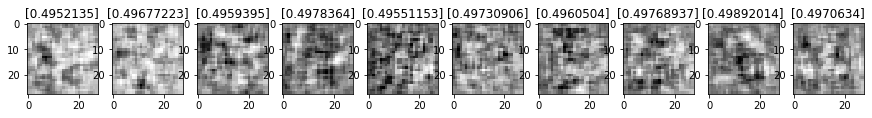

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


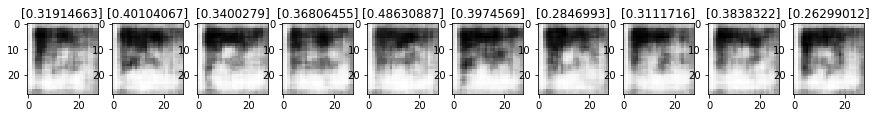

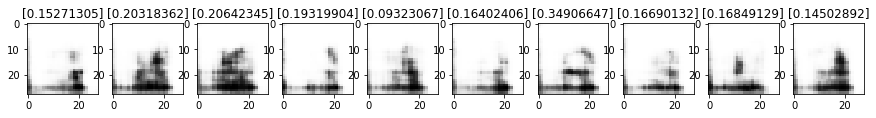

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


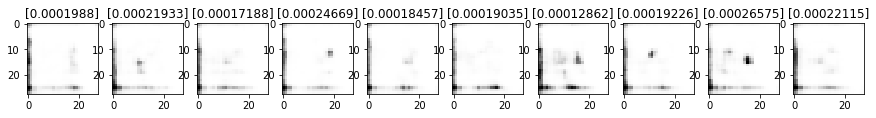

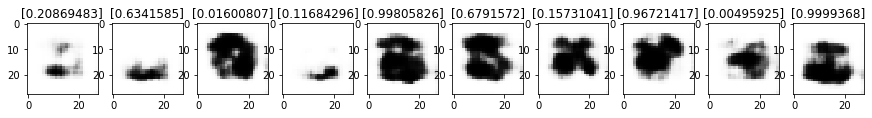

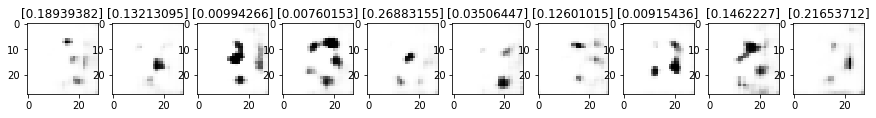

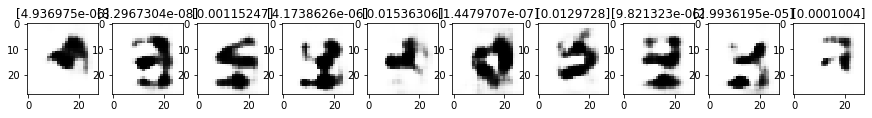

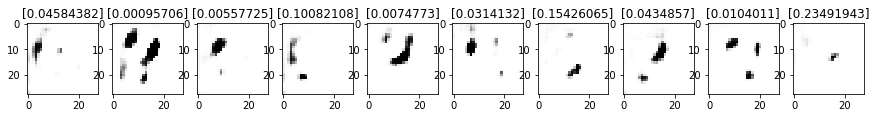

...

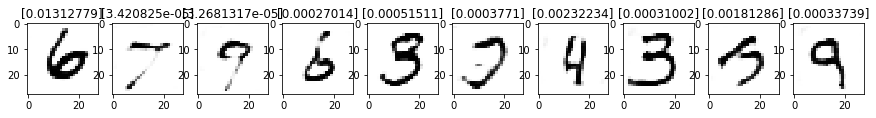

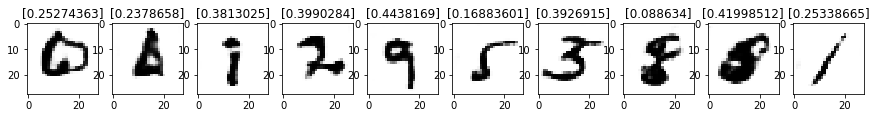

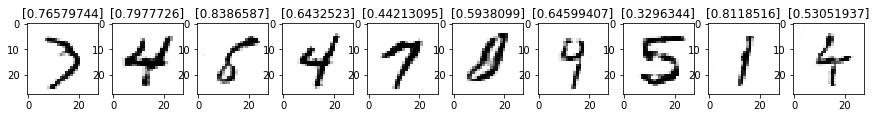

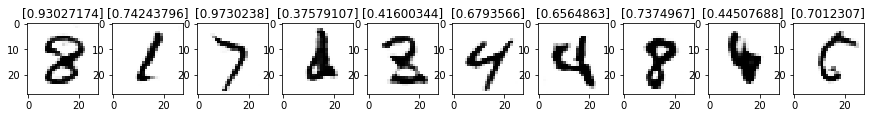

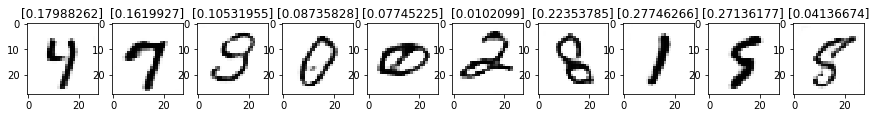

In [39]:
batch_size = 256

epochs = 200
disc_steps = 1
noise_level = 0.0

noise_shape = (100,)

def gen_loss(fake_pred):
    return cross_entropy(tf.ones_like(fake_pred),fake_pred)

def disc_loss(fake_pred, real_pred):
    loss_fake = cross_entropy(tf.zeros_like(fake_pred),fake_pred)
    loss_real = cross_entropy(tf.ones_like(real_pred),real_pred)
    return loss_fake + loss_real

@tf.function
def disc_step(batch):
    noise = tf.random.normal(((len(batch),)+noise_shape))
    with tf.GradientTape() as d_tape:
        x_pred = Gen(noise, training = True)
        fake_pred = Disc(x_pred, training = True)
        real_pred = Disc(batch, training = True)
        loss_d = disc_loss(fake_pred, real_pred)

    gradients_d = d_tape.gradient(loss_d, Disc.trainable_variables)
    Disc_Op.apply_gradients(zip(gradients_d, Disc.trainable_variables))
    
    return tf.reduce_mean(loss_d)
    
@tf.function
def train_step(batch):
    noise = tf.random.normal(((len(batch),)+noise_shape))
    with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:
        x_pred = Gen(noise, training = True)
        fake_pred = Disc(x_pred, training = True)
        real_pred = Disc(batch, training = True)
        loss_d = disc_loss(fake_pred, real_pred)
        loss_g = gen_loss(fake_pred)

    
    gradients_g = g_tape.gradient(loss_g, Gen.trainable_variables)
    Gen_Op.apply_gradients(zip(gradients_g, Gen.trainable_variables))

    gradients_d = d_tape.gradient(loss_d, Disc.trainable_variables)
    Disc_Op.apply_gradients(zip(gradients_d, Disc.trainable_variables))
    
    return tf.reduce_mean(loss_d), tf.reduce_mean(loss_g)
    
x_data = tf.data.Dataset.from_tensor_slices(x_train).shuffle(len(x_train)).batch(batch_size)
for epoch in range(epochs):
    disc_losses = []
    gen_losses = []
    
    bar = tqdm(enumerate(x_data), desc = 'Epoch ' + str(epoch+1), total = int(tf.data.experimental.cardinality(x_data))-2)
    for step, batch in bar:
        if (step+1) % disc_steps == 0:
          loss_d, loss_g = train_step(batch)
          disc_losses.append(loss_d.numpy())
          gen_losses.append(loss_g.numpy())
        else:
          loss_d = disc_step(batch)
          disc_losses.append(loss_d.numpy())

        mean_disc_loss = np.mean(disc_losses) if len(disc_losses) > 0 else 0
        mean_gen_loss = np.mean(gen_losses) if len(gen_losses) > 0 else 0
        bar.set_postfix(disc_loss = mean_disc_loss, gen_loss = mean_gen_loss)
      
    plot()

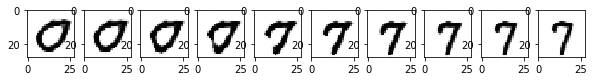

In [44]:
plt.figure(figsize = (10,10))
n1 = tf.random.normal((1,100))
n2 = tf.random.normal((1,100))
for i in range(10):
  plt.subplot(1,10,i+1)
  im = Gen((i*n1 + (9-i)*n2)/9).numpy()
  plt.imshow(im.reshape(28,28),cmap = 'Greys')

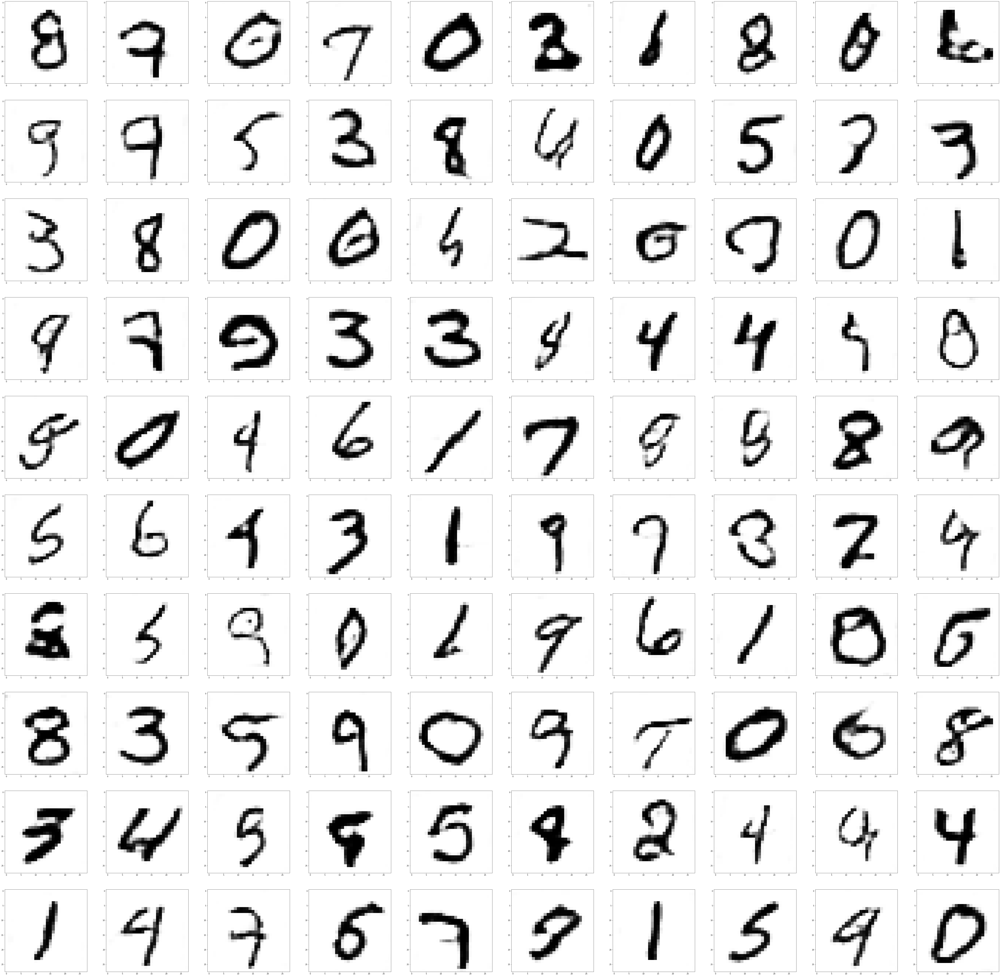

In [40]:
plt.figure(figsize = (100,100))
for i in range(10):
    for j in range(10):
        plt.subplot(10,10,10*i+j+1)
        im = Gen(tf.random.normal((1,100))).numpy()
        plt.imshow(im.reshape(28,28),cmap='Greys')
plt.show()